# Pregnancy Risk Prediction Dataset - Exploratory Data Analysis
---

This notebook performs an in-depth **Exploratory Data Analysis (EDA)** of the **Pregnancy Risk Prediction Dataset**. The dataset contains the following columns:

1. **Age**
2. **Body Temperature** (Fahrenheit)
3. **Heart Rate** (bpm)
4. **Systolic Blood Pressure** (mm Hg)
5. **Diastolic Blood Pressure** (mm Hg)
6. **BMI** (kg/m²)
7. **Blood Glucose** (HbA1c)
8. **Blood Glucose** (Fasting Hour, mg/dl)
9. **Outcome** (Categorical: Low Risk, Mid Risk, High Risk)

### Objective:
To analyze the data, uncover trends, detect anomalies, and prepare it for machine learning model building. The findings will guide the predictive modeling process for pregnancy risk levels.

---

### Author:
**SIVANESAN S**

### Organization:
**Infosys Internship Program**


In [2]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Display settings for better visuals
sns.set_theme()  # Apply Seaborn's default theme
pd.set_option('display.float_format', lambda x: '%.2f' % x)

# Load the dataset
file_path = r"C:\Users\91638\Downloads\Maternal_AI\Pregnancy Risk Prediction Dataset.csv"
try:
    data = pd.read_csv(file_path)
    print("Dataset Loaded Successfully!")
    display(data.head())
except FileNotFoundError:
    print(f"File not found: {file_path}. Please check the path and try again.")


Dataset Loaded Successfully!


,Age,Body Temperature(F),Heart rate(bpm),Systolic Blood Pressure(mm Hg),Diastolic Blood Pressure(mm Hg),BMI(kg/m 2),Blood Glucose(HbA1c),Blood Glucose(Fasting hour-mg/dl),Outcome
0,20,97.50,91,161,100,24.90,41,5.80,high risk
1,45,97.70,99,99,94,22.10,36,5.70,high risk
2,29,98.60,84,129,87,19.00,42,6.40,mid risk
3,26,99.50,135,161,101,23.70,46,4.50,high risk
4,38,102.50,51,106,91,18.80,38,4.30,high risk


In [3]:
# Check the structure and data types of the dataset
print("\nDataset Information:")
data.info()


Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6103 entries, 0 to 6102
Data columns (total 9 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                6103 non-null   int64  
 1   Body Temperature(F)                6103 non-null   float64
 2   Heart rate(bpm)                    6103 non-null   int64  
 3   Systolic Blood Pressure(mm Hg)     6103 non-null   int64  
 4   Diastolic Blood Pressure(mm Hg)    6103 non-null   int64  
 5   BMI(kg/m 2)                        6103 non-null   float64
 6   Blood Glucose(HbA1c)               6103 non-null   int64  
 7   Blood Glucose(Fasting hour-mg/dl)  6103 non-null   float64
 8   Outcome                            6103 non-null   object 
dtypes: float64(3), int64(5), object(1)
memory usage: 429.2+ KB


In [4]:
# Check for missing values
print("\nMissing Values Per Column:")
print(data.isnull().sum())


Missing Values Per Column:
Age                                  0
Body Temperature(F)                  0
Heart rate(bpm)                      0
Systolic Blood Pressure(mm Hg)       0
Diastolic Blood Pressure(mm Hg)      0
BMI(kg/m 2)                          0
Blood Glucose(HbA1c)                 0
Blood Glucose(Fasting hour-mg/dl)    0
Outcome                              0
dtype: int64


In [5]:
# Generate descriptive statistics for numerical features
print("\nDescriptive Statistics:")
display(data.describe())


Descriptive Statistics:


,Age,Body Temperature(F),Heart rate(bpm),Systolic Blood Pressure(mm Hg),Diastolic Blood Pressure(mm Hg),BMI(kg/m 2),Blood Glucose(HbA1c),Blood Glucose(Fasting hour-mg/dl)
count,6103.00,6103.00,6103.00,6103.00,6103.00,6103.00,6103.00,6103.00
mean,26.43,98.67,86.10,129.22,87.26,21.44,37.90,5.50
std,6.39,1.59,22.63,17.23,7.79,2.16,4.40,0.91
min,15.00,39.60,45.00,90.00,9.00,14.90,30.00,3.50
25%,22.00,98.60,72.00,120.00,82.00,19.60,34.00,4.80
50%,25.00,98.60,80.00,128.00,87.00,21.30,38.00,5.70
75%,30.00,98.80,91.00,141.00,92.00,23.10,41.00,6.00
max,250.00,104.00,150.00,169.00,142.00,27.90,50.00,8.90


In [6]:
# Remove trailing spaces in column names
data.columns = data.columns.str.strip()

# Check the cleaned column names
print(data.columns)


Index(['Age', 'Body Temperature(F)', 'Heart rate(bpm)',
       'Systolic Blood Pressure(mm Hg)', 'Diastolic Blood Pressure(mm Hg)',
       'BMI(kg/m 2)', 'Blood Glucose(HbA1c)',
       'Blood Glucose(Fasting hour-mg/dl)', 'Outcome'],
      dtype='object')


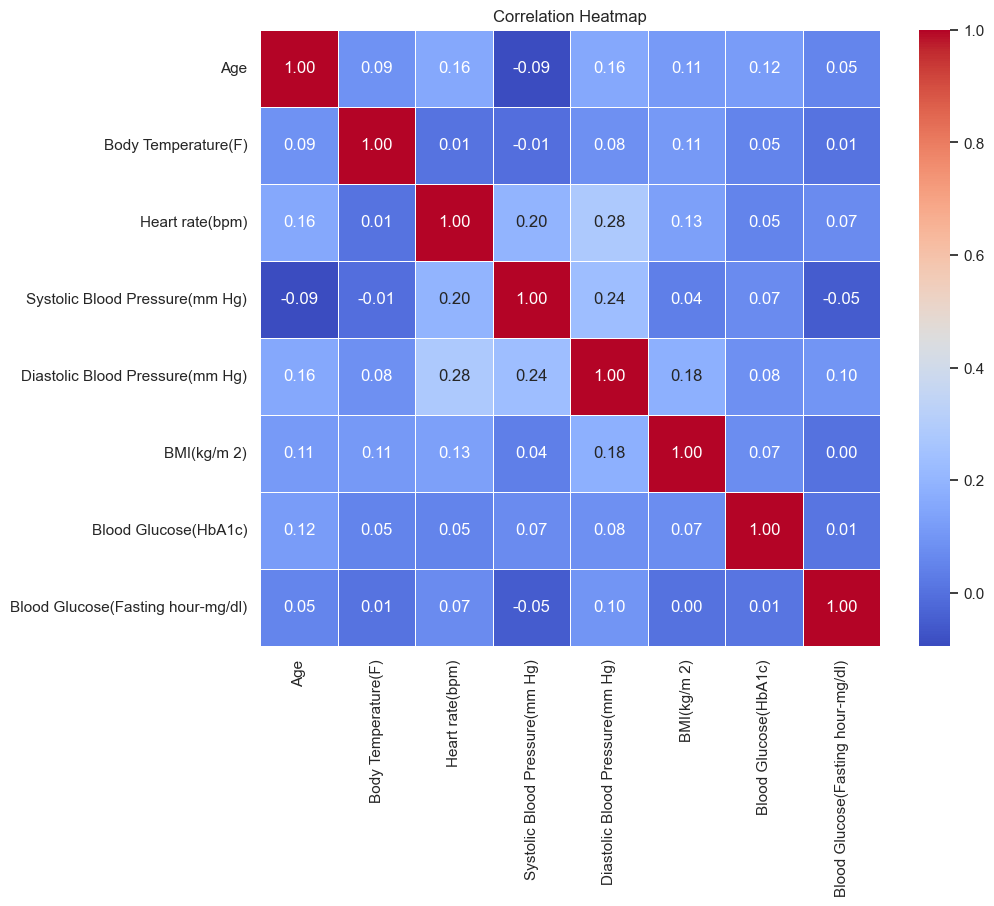

In [7]:
# Generate a correlation matrix for numerical features only
numeric_data = data.select_dtypes(include=[np.number])  # Select only numeric columns

# Handle any missing values (optional)
numeric_data = numeric_data.fillna(numeric_data.mean())  # Or use dropna() if you prefer

# Generate the correlation matrix
plt.figure(figsize=(10, 8))
correlation_matrix = numeric_data.corr()
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()


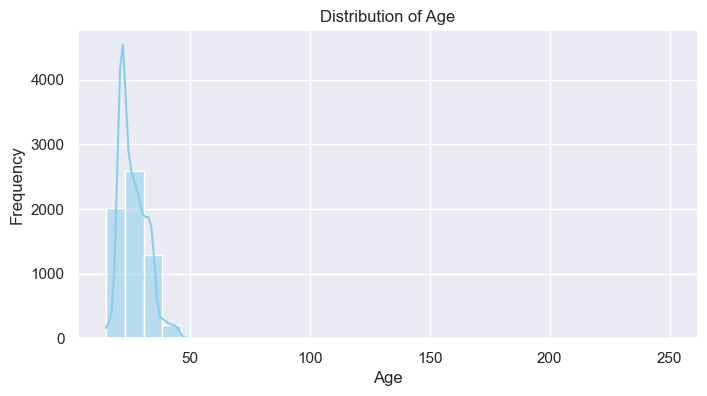

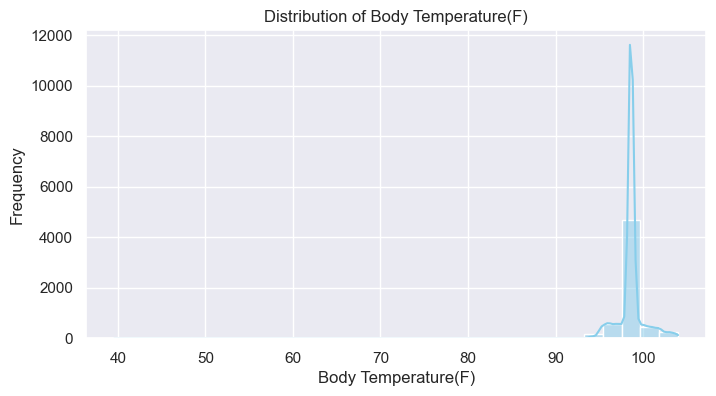

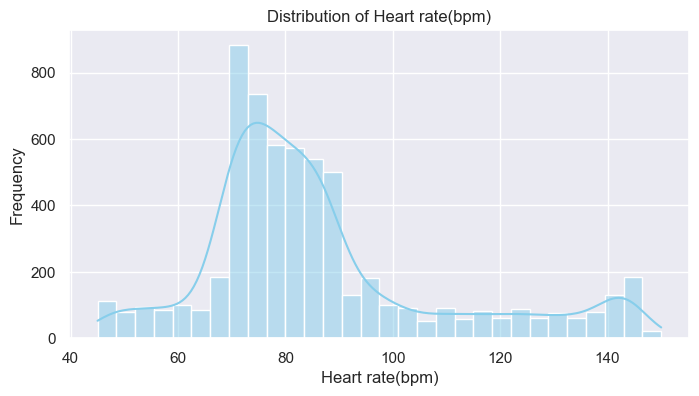

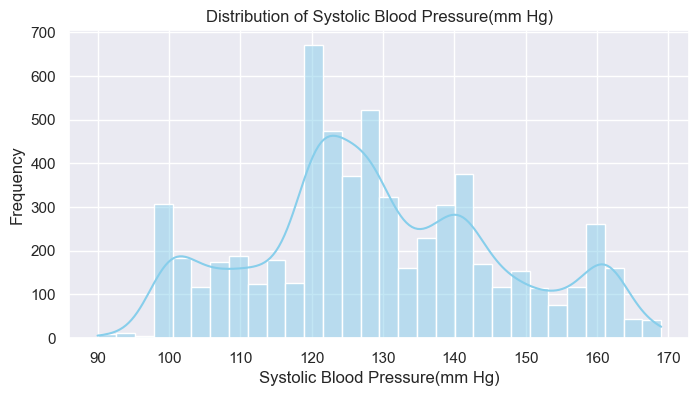

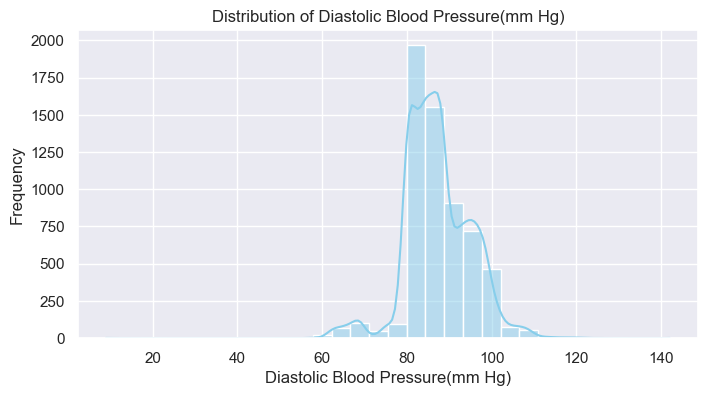

...

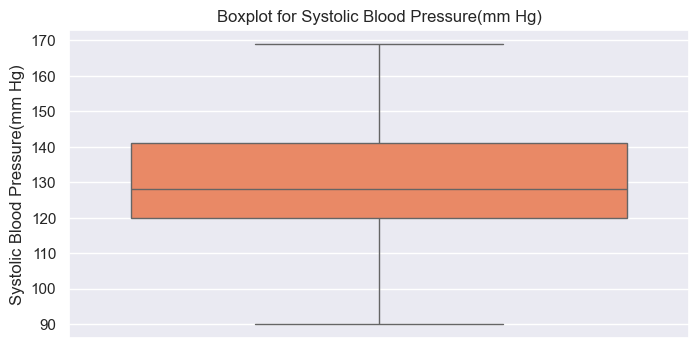

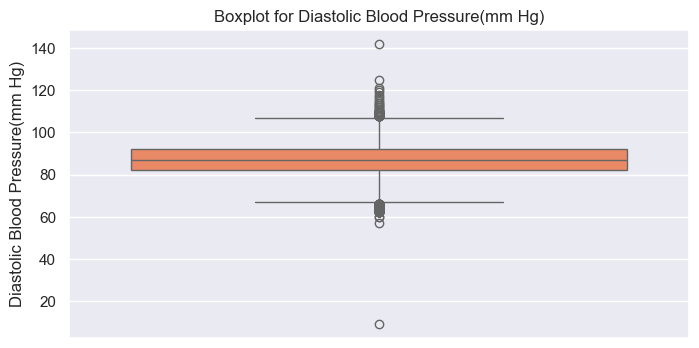

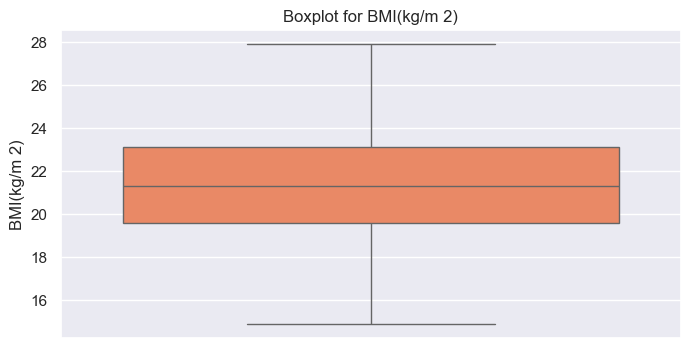

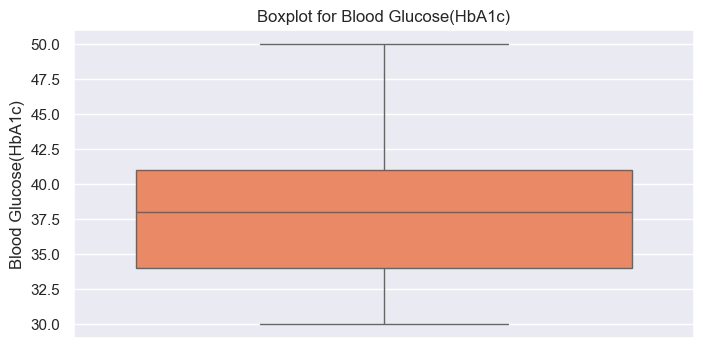

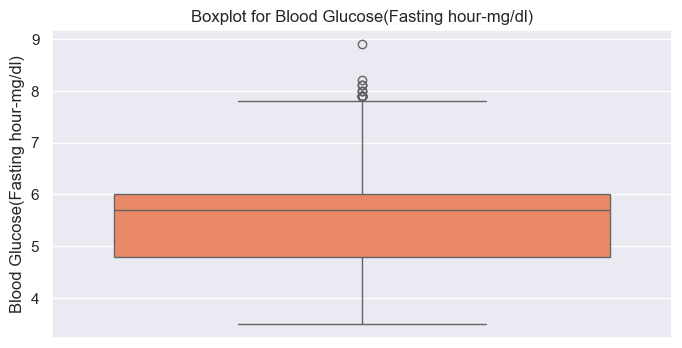

In [8]:
# List of numerical columns
numerical_columns = [
    'Age', 'Body Temperature(F)', 'Heart rate(bpm)', 
    'Systolic Blood Pressure(mm Hg)', 'Diastolic Blood Pressure(mm Hg)', 
    'BMI(kg/m 2)', 'Blood Glucose(HbA1c)', 'Blood Glucose(Fasting hour-mg/dl)'
]

# Plot histograms for numerical columns
for col in numerical_columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(data[col], kde=True, bins=30, color='skyblue')
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

# Plot boxplots to detect outliers
for col in numerical_columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(data[col], color='coral')
    plt.title(f"Boxplot for {col}")
    plt.show()


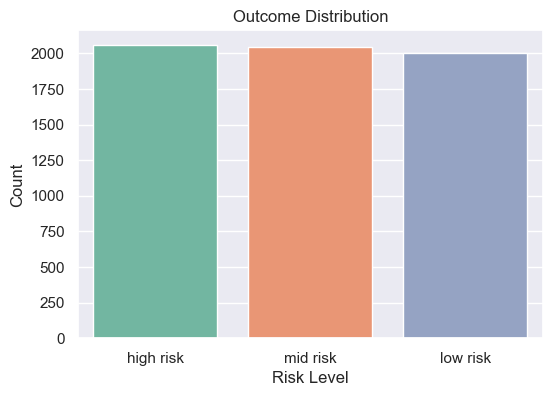

In [9]:
# Plot the distribution of Outcome using hue
plt.figure(figsize=(6, 4))
sns.countplot(data=data, x='Outcome', hue='Outcome', palette='Set2', legend=False)
plt.title("Outcome Distribution")
plt.xlabel("Risk Level")
plt.ylabel("Count")
plt.show()


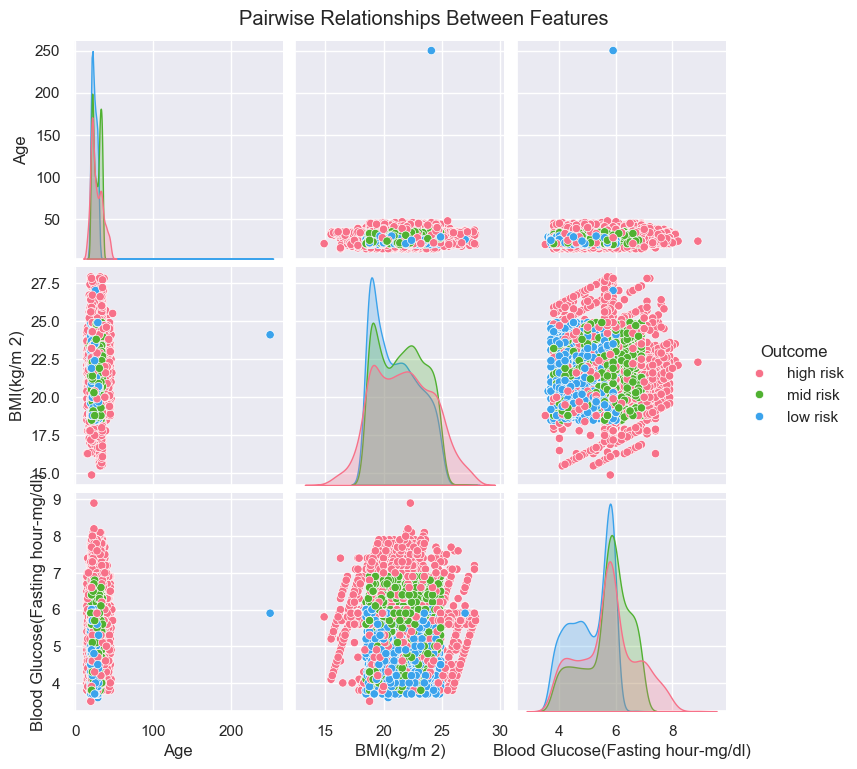

In [10]:
# Use pairplot for relationships between selected numerical features
selected_features = ['Age', 'BMI(kg/m 2)', 'Blood Glucose(Fasting hour-mg/dl)', 'Outcome']
sns.pairplot(data[selected_features], hue='Outcome', palette='husl', diag_kind='kde')
plt.suptitle("Pairwise Relationships Between Features", y=1.02)
plt.show()


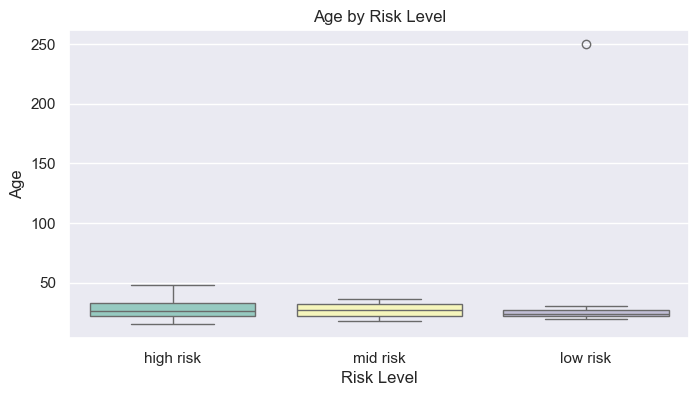

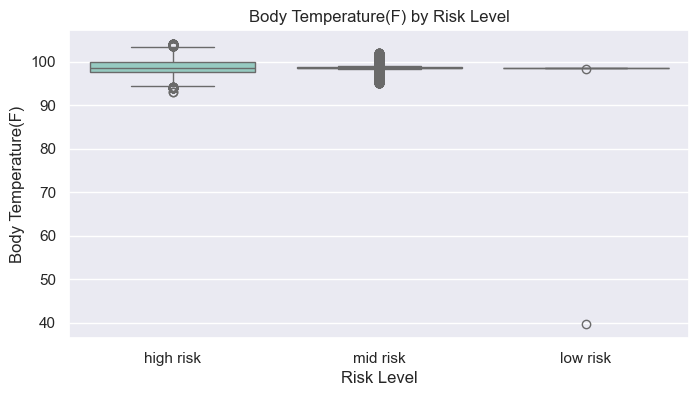

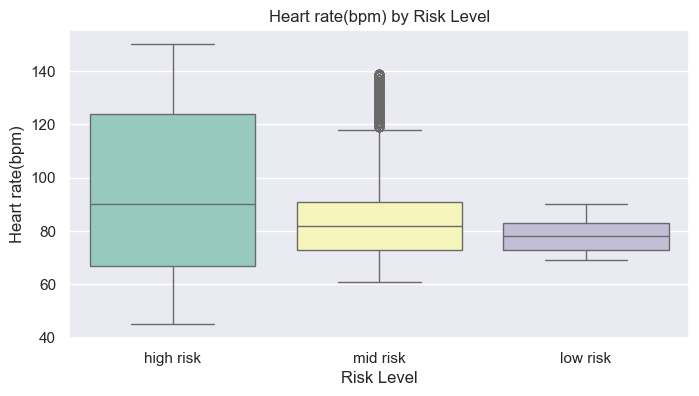

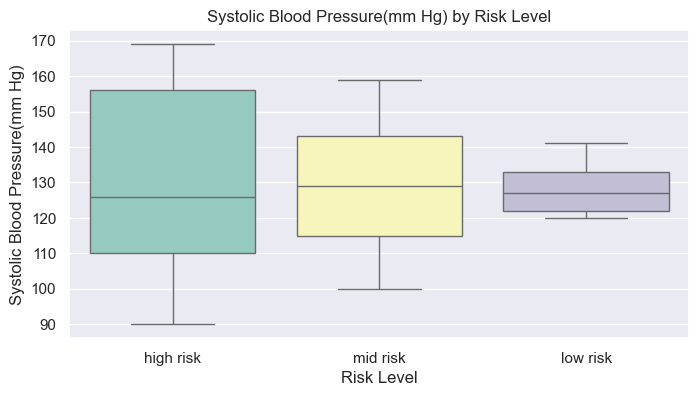

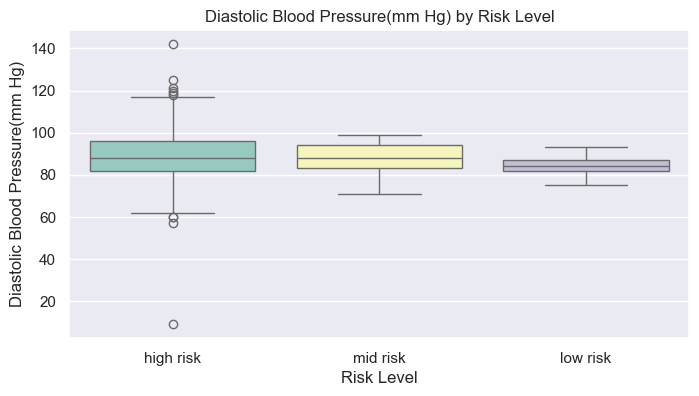

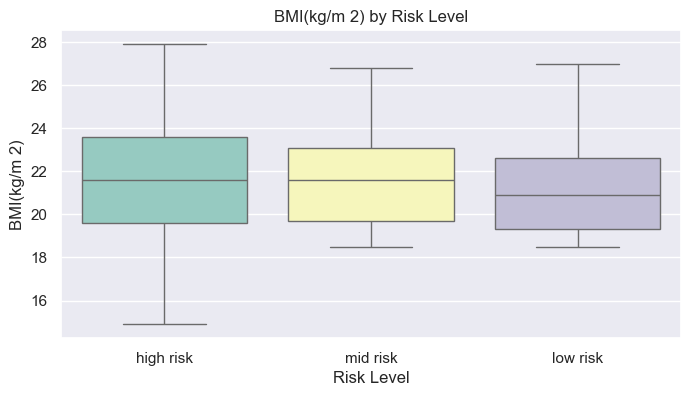

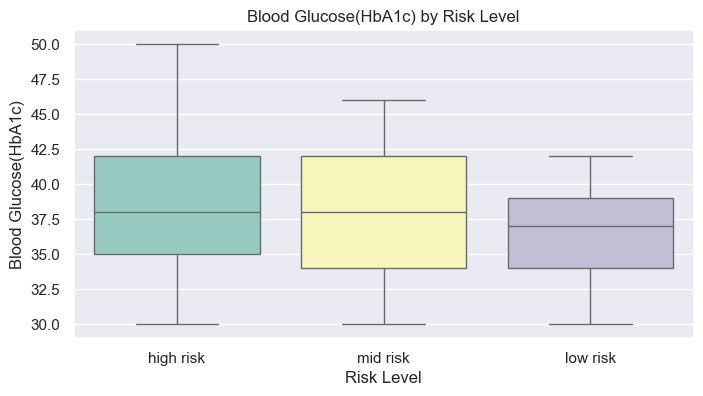

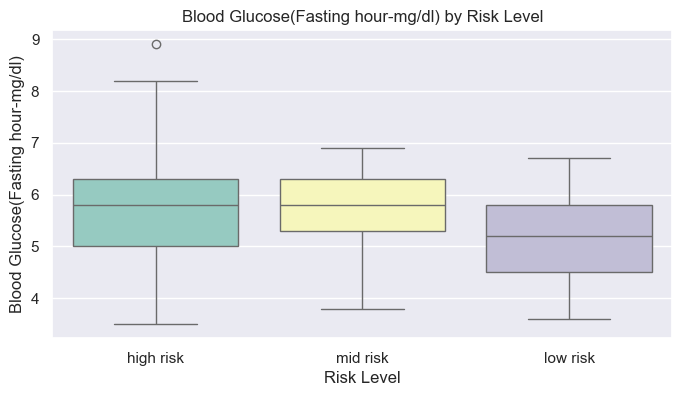

In [11]:
# Plot boxplots to explore the relationship between numerical features and Outcome
for col in numerical_columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(data=data, x='Outcome', y=col, hue='Outcome', palette='Set3', legend=False)
    plt.title(f"{col} by Risk Level")
    plt.xlabel("Risk Level")
    plt.ylabel(col)
    plt.show()


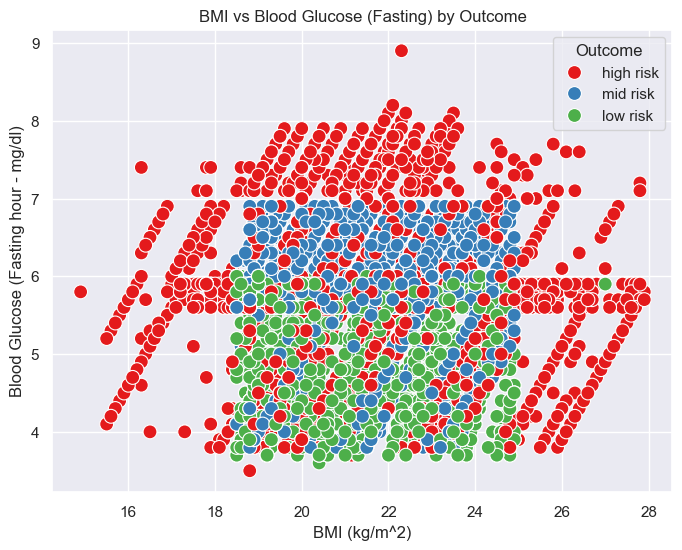

In [12]:
# Scatterplot: BMI vs Blood Glucose (Fasting) colored by Outcome
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data, x='BMI(kg/m 2)', y='Blood Glucose(Fasting hour-mg/dl)', hue='Outcome', palette='Set1', s=100)
plt.title("BMI vs Blood Glucose (Fasting) by Outcome")
plt.xlabel("BMI (kg/m^2)")
plt.ylabel("Blood Glucose (Fasting hour - mg/dl)")
plt.show()

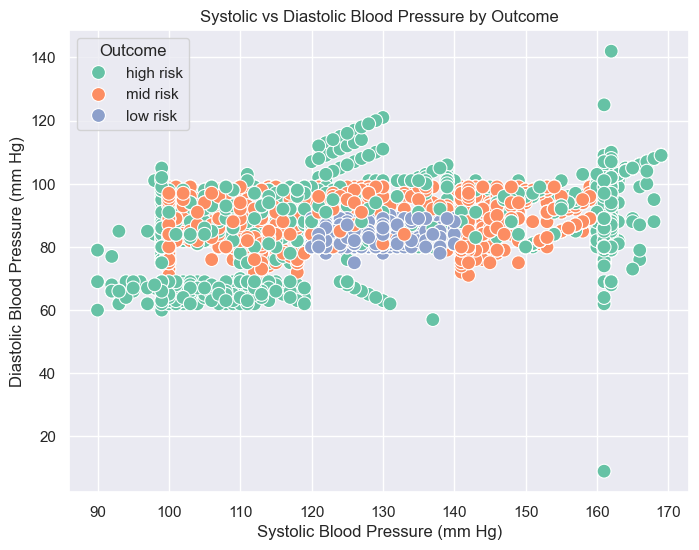

In [13]:
# Scatterplot: Systolic BP vs Diastolic BP colored by Outcome
plt.figure(figsize=(8, 6))
sns.scatterplot(data=data, x='Systolic Blood Pressure(mm Hg)', y='Diastolic Blood Pressure(mm Hg)', hue='Outcome', palette='Set2', s=100)
plt.title("Systolic vs Diastolic Blood Pressure by Outcome")
plt.xlabel("Systolic Blood Pressure (mm Hg)")
plt.ylabel("Diastolic Blood Pressure (mm Hg)")
plt.show()

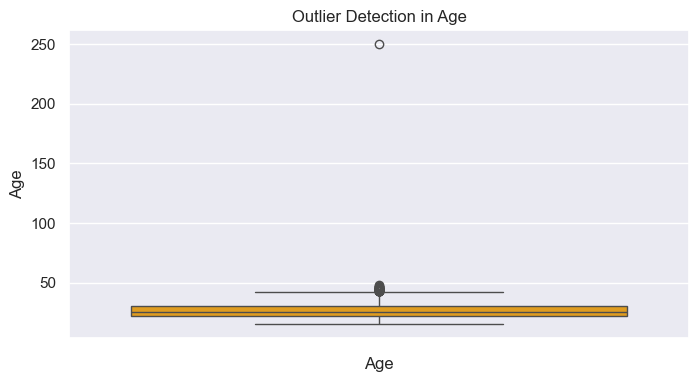

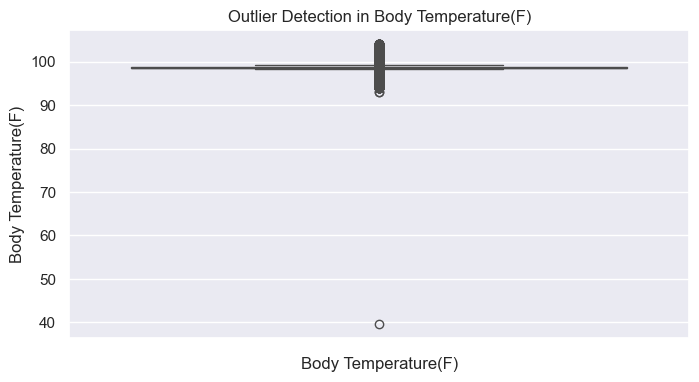

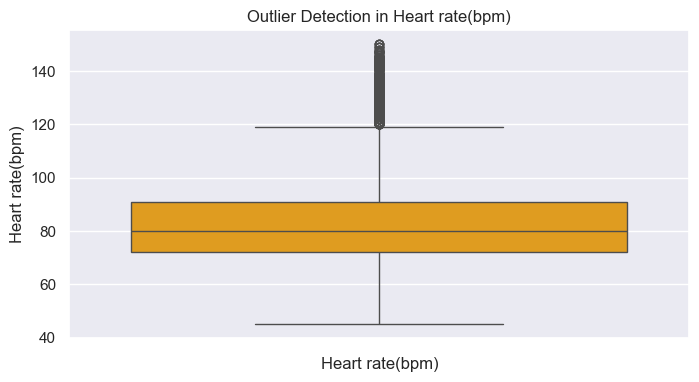

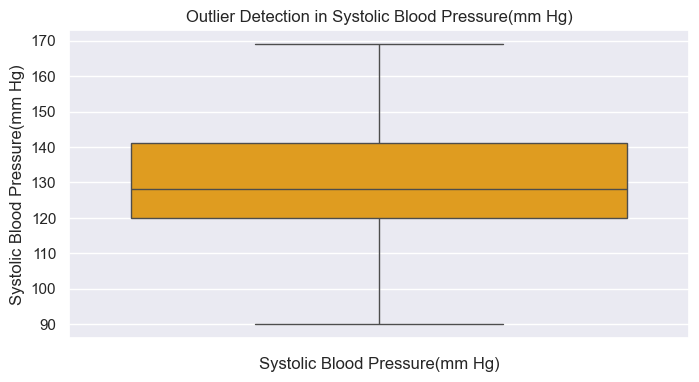

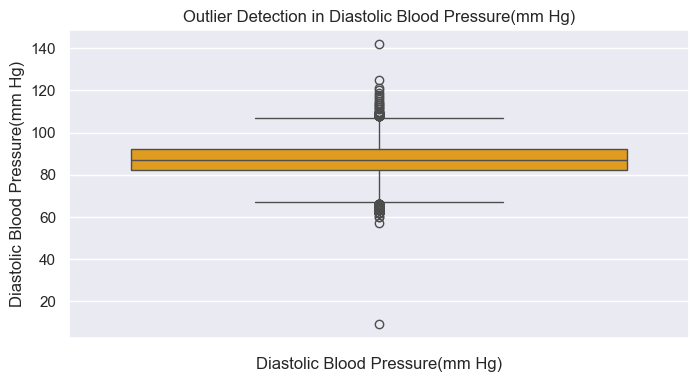

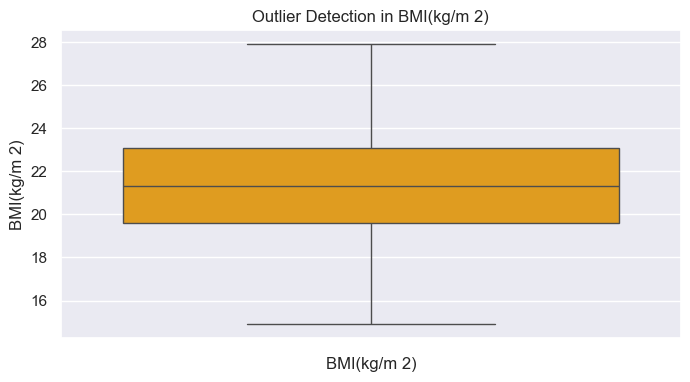

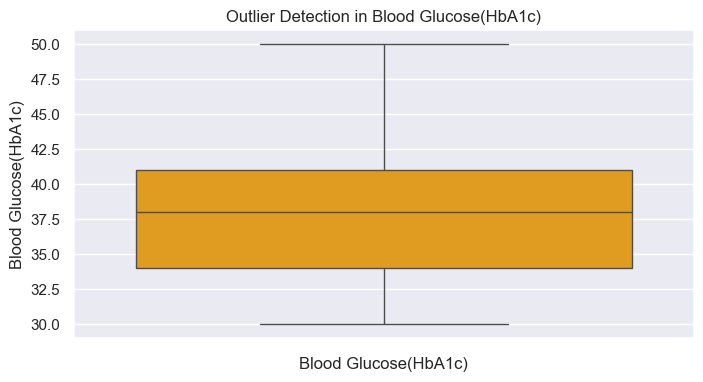

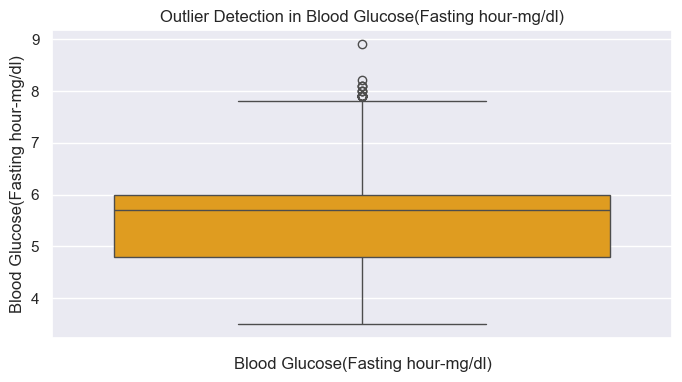

In [14]:
# Detect outliers for all numerical columns using boxplots
for col in numerical_columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(data[col], color='orange')
    plt.title(f"Outlier Detection in {col}")
    plt.xlabel(col)
    plt.show()


In [15]:
# Convert Outcome to numerical values for correlation analysis
data['Outcome_Numeric'] = data['Outcome'].map({'low risk': 0, 'mid risk': 1, 'high risk': 2})

# Select only numerical columns (excluding 'Outcome' as it's still a string)
numerical_data = data.select_dtypes(include=['float64', 'int64'])

# Correlation of features with Outcome_Numeric
correlation_with_outcome = numerical_data.corr()['Outcome_Numeric'].sort_values(ascending=False)
print("\nCorrelation of Features with Outcome:")
print(correlation_with_outcome)

# Drop the added column after analysis
data.drop(columns=['Outcome_Numeric'], inplace=True)



Correlation of Features with Outcome:
Outcome_Numeric                     1.00
Blood Glucose(Fasting hour-mg/dl)   0.28
Heart rate(bpm)                     0.28
Diastolic Blood Pressure(mm Hg)     0.22
Blood Glucose(HbA1c)                0.19
Age                                 0.19
BMI(kg/m 2)                         0.11
Body Temperature(F)                 0.08
Systolic Blood Pressure(mm Hg)      0.06
Name: Outcome_Numeric, dtype: float64


In [16]:
# Save the cleaned dataset for modeling
cleaned_file_path = r"C:\Users\91638\Downloads\Maternal_AI\Cleaned_Pregnancy_Risk_Dataset.csv"
data.to_csv(cleaned_file_path, index=False)
print(f"Cleaned dataset saved to: {cleaned_file_path}")


Cleaned dataset saved to: C:\Users\91638\Downloads\Maternal_AI\Cleaned_Pregnancy_Risk_Dataset.csv


In [17]:
import plotly.express as px
import altair as alt


In [18]:
# Plot BMI vs Blood Glucose (Fasting Hour) using Plotly
fig = px.scatter(
    data_frame=data,
    x='BMI(kg/m 2)',
    y='Blood Glucose(Fasting hour-mg/dl)',
    color='Outcome',
    size='Age',
    hover_data=['Heart rate(bpm)', 'Systolic Blood Pressure(mm Hg)', 'Diastolic Blood Pressure(mm Hg)'],
    title='Interactive Scatterplot: BMI vs Blood Glucose (Fasting Hour)',
    labels={'BMI(kg/m 2)': 'BMI (kg/m^2)', 'Blood Glucose(Fasting hour-mg/dl)': 'Fasting Glucose (mg/dl)'}
)
fig.update_traces(marker=dict(opacity=0.7, line=dict(width=1, color='DarkSlateGrey')))
fig.show()


In [19]:
from sklearn.preprocessing import LabelEncoder
import plotly.express as px

# Initialize the label encoder
label_encoder = LabelEncoder()

# Assuming 'Outcome' is the column with the categorical values (e.g., 'high risk')
data['Outcome'] = label_encoder.fit_transform(data['Outcome'])

# Now compute the correlation matrix
correlation_matrix = data.corr()

# Create and display the heatmap
fig = px.imshow(
    correlation_matrix,
    text_auto=True,
    color_continuous_scale='Viridis',  # Use a valid color scale such as 'Viridis'
    title="Interactive Correlation Heatmap"
)
fig.update_layout(
    autosize=True,
    margin=dict(l=40, r=40, t=40, b=40),
    coloraxis_colorbar=dict(title="Correlation Coefficient")
)
fig.show()


In [20]:
import altair as alt

# Explicitly set the data transformer
alt.data_transformers.enable('vegafusion')

DataTransformerRegistry.enable('vegafusion')

In [21]:
import altair as alt
import pandas as pd

# Disable VegaFusion transformer
alt.data_transformers.disable_max_rows()

# Select key features for pairwise analysis
key_features = ['Age', 'BMI(kg/m 2)', 'Blood Glucose(Fasting hour-mg/dl)', 'Outcome']

# Prepare the data for Altair
alt_data = data[key_features]

# Scatterplot matrix
chart = alt.Chart(alt_data).mark_circle(size=60).encode(
    x=alt.X(alt.repeat('column'), type='quantitative'),
    y=alt.Y(alt.repeat('row'), type='quantitative'),
    color=alt.Color('Outcome:N'),
    tooltip=['Age', 'BMI(kg/m 2)', 'Blood Glucose(Fasting hour-mg/dl)', 'Outcome']
).properties(
    width=150,
    height=150
).repeat(
    row=['Age', 'BMI(kg/m 2)'],
    column=['Blood Glucose(Fasting hour-mg/dl)', 'BMI(kg/m 2)']
).interactive()

chart

alt.RepeatChart(...)

In [22]:
# Create a melted dataframe for easier visualization
melted_data = data.melt(
    id_vars='Outcome',
    value_vars=['Systolic Blood Pressure(mm Hg)', 'Diastolic Blood Pressure(mm Hg)'],
    var_name='Blood Pressure Type',
    value_name='Pressure'
)

# Interactive line chart
chart = alt.Chart(melted_data).mark_line(point=True).encode(
    x='Outcome:N',
    y='Pressure:Q',
    color='Blood Pressure Type:N',
    strokeDash='Blood Pressure Type:N',
    tooltip=['Outcome', 'Blood Pressure Type', 'Pressure']
).properties(
    title="Trends of Blood Pressure by Outcome",
    width=600,
    height=400
).interactive()

chart.display()


alt.Chart(...)

In [23]:
# Create an age group column for analysis
data['Age Group'] = pd.cut(data['Age'], bins=[20, 30, 40, 50], labels=['20-30', '30-40', '40-50'])

# Interactive bar chart
fig = px.bar(
    data_frame=data,
    x='Age Group',
    color='Outcome',
    barmode='group',
    title='Outcome Count by Age Group',
    labels={'Age Group': 'Age Group', 'Outcome': 'Risk Level'},
    text_auto=True
)
fig.update_layout(
    xaxis=dict(title='Age Group'),
    yaxis=dict(title='Count'),
    legend=dict(title='Outcome'),
    template='plotly_white'
)
fig.show()


In [24]:
# Dropdown filter for scatterplot (BMI vs Fasting Glucose)
fig = px.scatter(
    data,
    x='BMI(kg/m 2)',
    y='Blood Glucose(Fasting hour-mg/dl)',
    color='Outcome',
    title="BMI vs Fasting Glucose with Dropdown Filters",
    hover_data=['Age', 'Heart rate(bpm)', 'Systolic Blood Pressure(mm Hg)'],
)

# Adding dropdown filter to show/hide categories
fig.update_layout(
    updatemenus=[
        dict(
            buttons=[
                dict(label="All", method="update", args=[{"visible": [True, True, True]}]),
                dict(label="Low Risk", method="update", args=[{"visible": [True, False, False]}]),
                dict(label="Mid Risk", method="update", args=[{"visible": [False, True, False]}]),
                dict(label="High Risk", method="update", args=[{"visible": [False, False, True]}]),
            ],
            direction="down",
        )
    ]
)

fig.show()


In [25]:
# Create age groups for animation
data['Age Group'] = pd.cut(data['Age'], bins=[20, 30, 40, 50], labels=['20-30', '30-40', '40-50'])

# Animated scatterplot
fig = px.scatter(
    data,
    x='BMI(kg/m 2)',
    y='Blood Glucose(Fasting hour-mg/dl)',
    color='Outcome',
    animation_frame='Age Group',
    size='Heart rate(bpm)',
    title="Animated BMI vs Fasting Glucose Across Age Groups",
    labels={'BMI(kg/m 2)': 'BMI (kg/m^2)', 'Blood Glucose(Fasting hour-mg/dl)': 'Fasting Glucose (mg/dl)'},
)
fig.show()


In [26]:
# Stacked bar chart: Outcome distribution by Age Group
fig = px.bar(
    data,
    x='Age Group',
    y='BMI(kg/m 2)',
    color='Outcome',
    title='Stacked Bar Chart: BMI Distribution by Age Group and Outcome',
    text_auto=True
)
fig.update_layout(
    barmode='stack',
    xaxis_title='Age Group',
    yaxis_title='BMI (kg/m^2)',
    template='plotly_white',
    legend_title='Risk Level'
)
fig.show()


In [28]:
import altair as alt

# Define the brush selection
brush = alt.selection_interval()

# Create the scatter plot with brushing
scatter = alt.Chart(data).mark_point(filled=True, size=60).encode(
    x='BMI(kg/m 2):Q',
    y='Blood Glucose(Fasting hour-mg/dl):Q',
    color=alt.condition(brush, 'Outcome:N', alt.value('lightgray')),
    tooltip=['Age', 'Outcome', 'BMI(kg/m 2)', 'Blood Glucose(Fasting hour-mg/dl)']
).add_params(brush).properties(
    title='Interactive Scatterplot with Brushing',
    width=600,
    height=400
)

scatter.display()


alt.Chart(...)

In [34]:
import altair as alt
import pandas as pd

# Correct numerical columns list
numerical_columns = [
    'Age', 
    'Body Temperature(F)', 
    'Heart rate(bpm)', 
    'Systolic Blood Pressure(mm Hg)', 
    'Diastolic Blood Pressure(mm Hg)', 
    'BMI(kg/m 2)', 
    'Blood Glucose(HbA1c)', 
    'Blood Glucose(Fasting hour-mg/dl)'
]

# Convert numerical_columns to long-form data
data_long = data.melt(value_vars=numerical_columns, var_name='Feature', value_name='Value')

# Create a faceted heatmap for correlation
heatmap = alt.Chart(data_long).mark_rect().encode(
    alt.X('Feature:N', title='Feature 1'),
    alt.Y('Feature:N', title='Feature 2'),
    alt.Color('Value:Q', scale=alt.Scale(scheme='viridis')),
    tooltip=['Feature', 'Value']
).properties(
    title="Faceted Correlation Heatmap",
    width=400,
    height=400
)

heatmap.display()


alt.Chart(...)

In [38]:
# Bar Chart: Outcome Distribution by Age Group
age_group_counts = data.groupby(['Age Group', 'Outcome'], observed=False).size().reset_index(name='Count')
age_group_counts['Age Outcome'] = age_group_counts['Age Group'].astype(str) + ' (' + age_group_counts['Outcome'].astype(str) + ')'

bar = go.Bar(
    x=age_group_counts['Age Outcome'],
    y=age_group_counts['Count'],
    name="Outcome Distribution",
    marker_color='blue'
)
fig.add_trace(bar, row=1, col=2)


In [39]:
fig = px.scatter(
    data,
    x='BMI(kg/m 2)',
    y='Blood Glucose(Fasting hour-mg/dl)',
    color='Outcome',
    size='Heart rate(bpm)',
    title="BMI vs Fasting Glucose with Custom Tooltips",
    hover_data={
        'BMI(kg/m 2)': ':.2f',
        'Blood Glucose(Fasting hour-mg/dl)': ':.2f',
        'Systolic Blood Pressure(mm Hg)': True,
        'Diastolic Blood Pressure(mm Hg)': True,
        'Age': True,
    }
)
fig.update_traces(marker=dict(opacity=0.8))
fig.show()


In [40]:
# Add percentage tooltips for outcome distribution
age_group_counts['Percentage'] = 100 * age_group_counts['Count'] / age_group_counts['Count'].sum()

fig = px.bar(
    age_group_counts,
    x='Age Group',
    y='Count',
    color='Outcome',
    text='Percentage',
    title="Outcome Distribution by Age Group with Percentages",
    hover_data={
        'Count': True,
        'Percentage': ':.1f'
    }
)
fig.update_traces(texttemplate='%{text:.1f}%', textposition='outside')
fig.update_layout(
    xaxis_title="Age Group",
    yaxis_title="Count",
    uniformtext_minsize=8,
    uniformtext_mode='hide'
)
fig.show()


In [41]:
# Create age bins for animation
data['Age Group'] = pd.cut(data['Age'], bins=[20, 30, 40, 50], labels=['20-30', '30-40', '40-50'])

fig = px.line(
    data_frame=data,
    x='Age Group',
    y='BMI(kg/m 2)',
    color='Outcome',
    animation_group='Outcome',
    animation_frame='Age',
    title='BMI Trends Across Age Groups',
    labels={'BMI(kg/m 2)': 'BMI (kg/m^2)', 'Age Group': 'Age Group'},
    markers=True
)
fig.update_layout(
    xaxis_title="Age Group",
    yaxis_title="BMI (kg/m^2)",
    template="plotly_white"
)
fig.show()


In [43]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier
import joblib

# Load the dataset
file_path = r'C:\Users\91638\Downloads\Infosys Internship\Pregnancy Prediction\Pregnancy Risk Prediction Dataset.csv'
data = pd.read_csv(file_path)

# Prepare features (X) and target variable (y)
X = data.drop(columns='Outcome')  # Drop the 'Outcome' column (target variable)
y = data['Outcome']

# Encoding the 'Outcome' column (low risk, mid risk, high risk)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)  # Encoding 'Outcome' into numeric labels

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature scaling (optional but recommended)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train XGBoost model
xgb_model = XGBClassifier(random_state=42)
xgb_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = xgb_model.predict(X_test)

# Accuracy Score
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy*100:.2f}%")

Accuracy: 99.26%


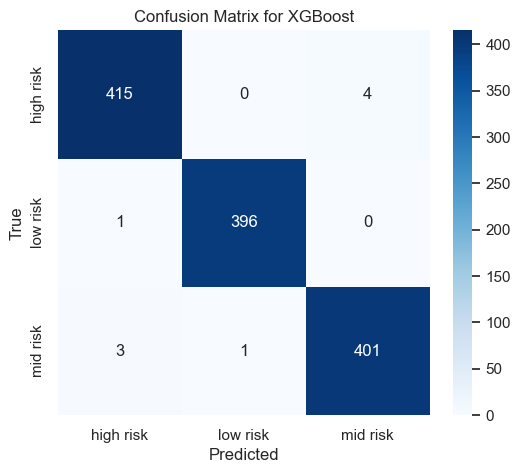

In [48]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Confusion Matrix for XGBoost")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


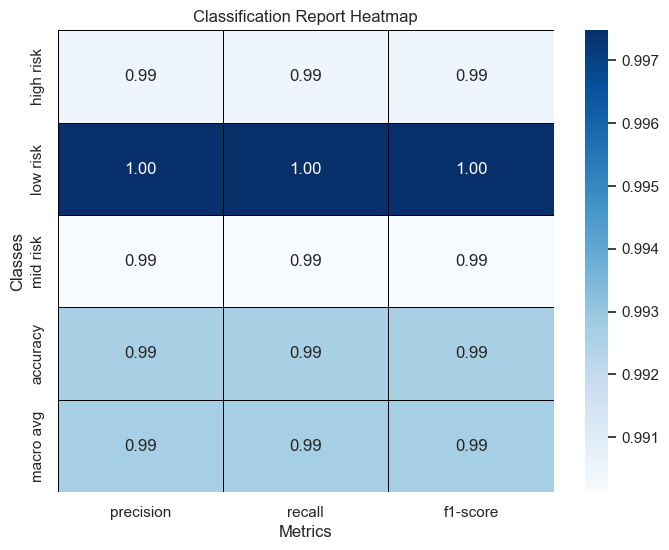

In [46]:
from sklearn.metrics import classification_report

# Generate the classification report
report = classification_report(y_test, y_pred, target_names=le.classes_, output_dict=True)

# Convert the report to a DataFrame for better visualization
report_df = pd.DataFrame(report).transpose()

# Set up the color palette for the heatmap (can be customized)
sns.set(style="whitegrid", palette="Blues")

# Create a heatmap using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap="Blues", fmt=".2f", cbar=True, linewidths=0.5, linecolor='black', annot_kws={'size': 12})
plt.title("Classification Report Heatmap")
plt.xlabel("Metrics")
plt.ylabel("Classes")
plt.show()

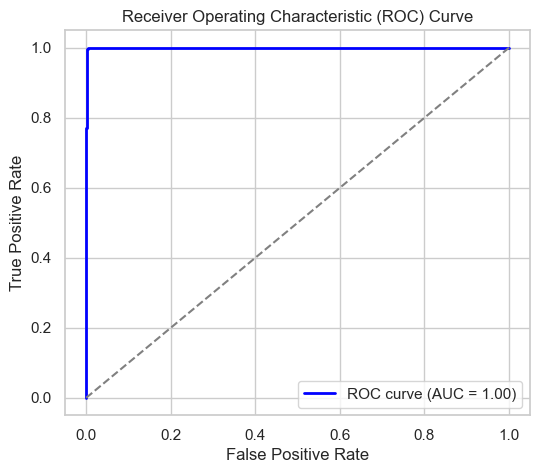

In [49]:
# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, xgb_model.predict_proba(X_test)[:, 1], pos_label=1)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

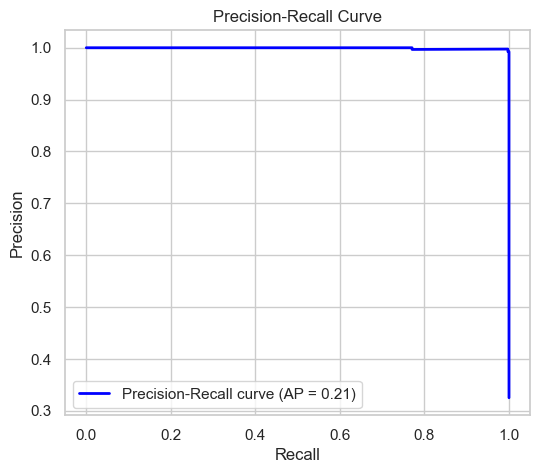

In [55]:
# Precision-Recall Curve
# Ensure y_scores is 2D
y_scores = xgb_model.predict_proba(X_test)[:, 1].reshape(-1, 1)

# Calculate Precision-Recall curve
precision, recall, thresholds_pr = precision_recall_curve(y_test, y_scores, pos_label=1)

# Calculate Average Precision score (AP)
average_precision = average_precision_score(y_test, y_scores)

# Plot Precision-Recall curve
plt.figure(figsize=(6, 5))
plt.plot(recall, precision, color='blue', lw=2, label=f'Precision-Recall curve (AP = {average_precision:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")
plt.show()


In [56]:
# Save the model and scaler
joblib.dump(xgb_model, 'xgb_model.pkl')
joblib.dump(scaler, 'scaler.pkl')
joblib.dump(le, 'label_encoder.pkl')

print("\nModel and related files saved successfully!")


Model and related files saved successfully!


<h1><b>Done by: Sivanesan S</b></h1>
